In [1]:
import numpy as np
from IPython.display import display, HTML
!pip install matplotlib
import matplotlib.pyplot as plt
# import sklearn 
from sklearn.manifold import TSNE
import pandas as pd
import re
import ast
import json
import pickle
import torch
import torch.nn as nn
import torch.nn.functional as F
import os
import logging
import torch.optim as optim
from torch.utils.data import DataLoader
import codecs


[notice] A new release of pip is available: 23.2.1 -> 24.0
[notice] To update, run: pip install --upgrade pip


/Users/tejasr/opt/anaconda3/envs/pytorch/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Considering Source Code as Plain Text

The source-based models can learn statistical correlations in how code is written, leveraging
techniques from natural language processing, but don’t
have any inherent knowledge about the structure or semantics of the language built in (these must all be learned
from data). <br>
Why treating Code as Plain Text is not ideal?<br>
Natural languages are always written/spoken in
one dimension as time flows. By contrast, programmers always
organize their source codes with proper indentation, indicating
branches, loops or even nested structures. It will be extremely
difficult to read source codes if they are written in one line
(like natural languages). The formal grammar rules of the
programming language alias the notion of neighborhood. To
be concrete, physically neighboring stuffs in a program source
code are not necessarily near to each other, but those in one
grammar rule are. Source code as plain text is addressed in tokenize.ipynb

##  To build program vector representations based on abstract syntax trees
Each node in ASTs (e.g. ID, Constant) is mapped to a real-valued vector, with each element indicating a certain feature of the node. We to map each symbol to a real-valued vector in some dimension.Each element in the vector characterizes a certain feature of the symbol spontaneously. Due to the structural differences between natural languages and programming languages, existing representation learning algorithms in NLP are improper for programs.<br>
Why we choose node level granularity? In NLP you have token level, character level, etc. <br>
1) Character level- Not appropriate. e.g double and doubles share most characters, which leads to similar vector representations, even though one is an identifier and one is a keyword. <br>
2) Token level- Identifiers create problems of infinite tokens and data sparseness. Less compact representation, two tokens for parentheses. These is improved in a compact data structure like an AST. <br>
3) AST level- More compressed. Finite number of possible nodes. Can learn structural info, hierarchical information.  Drawback: since we regard all identifiers as a same symbol. We hypothesize that structural information captures the semantics of programs to a large extent. For example, if we see two nestedfor-loops, inside of which is a branch of comparison followed by three assignments, the code snippet is likely to be an implementation of bubble sort. <br>

Formalization: We expect symbols as ID, Constant are similar because both of them are related to data reference; For, While are similar because both are related to loops. We wish to capture such similarity from AST. <br>
The idea is that the representation of a node in ASTs should be “coded” by its children’s representations via a single neural layer.

Using a strategy similar to skip-gram.  The skip-gram model, given an input word in a sentence, looks at the words nearby and picks one at random.  The model predicts the probability for each word in the whole vocabulary to be a “nearby word” of the input word. So the task here is to “predict the contextual words given an input word”. <br>
Implementation idea 1: we pick random children of a given AST node. The networks, in this case, will tell us the probability for each node in the whole AST vocabulary to be the "parent" the “chosen children”. The vocabulary words, in this case, are the AST node types, which are of rather small sizes. 

I use the py150 dataset which contains ASTs of python source code in json files. These AST's can be found from source code easily using python's AST module. 

## Method 1: AST2Vec<br>
Based on the idea in https://github.com/bdqnghi/ast-node-encoding. I have used pytorch for coding in this notebook.<br>


### Preprocessing of AST's in py150 json

In [2]:
nodes= []
# this reads asts from py150, and converts it to a form which we can use later
# this processing stores the parent node within each node dictionary as well as children types and indi
def convert_parsed_ast(parsed_ast):
    converted_ast = []
    node_dict = {}

    # Create a dictionary to store the index of each node
    for i, node in enumerate(parsed_ast):
        node_dict[i] = node

    # Iterate through parsed AST and convert each node
    for i, node in enumerate(parsed_ast):
        converted_node = {'node': node['type'], 'value': node.get('value', None), 'children': [], 'parent': None, 'children_indices': node.get('children', [])}

        # Convert children indices to node types
        children_indices = node.get('children', [])
        for child_index in children_indices:
            child_node = node_dict[child_index]
            converted_node['children'].append(child_node['type'])

        # Set parent node
        parent_index = None
        for index, other_node in node_dict.items():
            if i in other_node.get('children', []):
                parent_index = index
                break
        if parent_index is not None:# if the current node i is in the children list of node at index 
#                 # can break immediately because each node has a maximum of one parent
            converted_node['parent'] = node_dict[parent_index]['type']

        converted_ast.append(converted_node)
        nodes.append(converted_node)

    return converted_ast

In [23]:
nodes.clear()
input_file_path = "py150/python100k_train.json"  
output_file_path = "py150/output"  # Path to save the output .pkl file
parsed_asts = []
num= 1000 # determines the number of ASTs or python source files to use. Increase for more training data
with open(input_file_path, 'r') as f:
	for line in f:
		parsed_asts.append(json.loads(line))
		num-=1
		if(num==0):
			break

nodetypes= set() # nodetypes is the set we use to store all the unique token types in the AST 
nodevalues = set()  # Set to store unique node values
# Convert parsed AST to new format
converted_asts= []
for parsed_ast in parsed_asts:
    converted_ast = convert_parsed_ast(parsed_ast)
    converted_asts.append(converted_ast)
    
for converted_ast in converted_asts:
    for d in converted_ast:
        # print(d.keys())
        nodetypes.add(d['node'])  # Add unique node types to nodetypes set
        nodevalues.add(d['value'])  # Add unique node values to nodevalues set

print("Length ",len(nodes))
f = open(output_file_path + '.pkl',"wb")
# for node in nodes:
pickle.dump(nodes, f)

Length  800977


This is saved in output.pkl. <br>

In [24]:
def generate_dictionary_data(nodetypes):
    node_to_index= dict() # node_to_index : A dictionary mapping each node type to an integer value 'alias': 0, 'Module': 1
    index_to_node = dict() #index_to_node : A dictionary mapping each word to an integer value 0: 'alias', 1: 'Module'
    count = 0
    vocab_size = 0 # vocab_size : Number of unique nodes in AST
    for node in nodetypes: 
        node_to_index[node]= count
        index_to_node[count]= node
        count+=1
    vocab_size = len(nodetypes)
    
    return node_to_index,index_to_node,vocab_size

In [25]:
node_to_index,index_to_node,vocab_size = generate_dictionary_data(nodetypes)
print('Number of unique words:' , vocab_size)
print('word_to_index : ',node_to_index)
print('index_to_word : ',index_to_node)
print(len(nodevalues))

Number of unique words: 117
word_to_index :  {'body': 0, 'Index': 1, 'If': 2, 'While': 3, 'CompareIn': 4, 'AugAssignMult': 5, 'Import': 6, 'ExtSlice': 7, 'Dict': 8, 'ListComp': 9, 'Exec': 10, 'AugAssignMod': 11, 'CompareEqEqEqEqEqEq': 12, 'AttributeLoad': 13, 'Lambda': 14, 'TryFinally': 15, 'kwarg': 16, 'CompareGtE': 17, 'identifier': 18, 'BinOpAdd': 19, 'UnaryOpNot': 20, 'NameParam': 21, 'Raise': 22, 'finalbody': 23, 'GeneratorExp': 24, 'arguments': 25, 'BinOpRShift': 26, 'BinOpPow': 27, 'ListStore': 28, 'Print': 29, 'For': 30, 'Delete': 31, 'ClassDef': 32, 'Break': 33, 'BinOpMod': 34, 'AugAssignSub': 35, 'BinOpBitXor': 36, 'NameStore': 37, 'name': 38, 'decorator_list': 39, 'UnaryOpUSub': 40, 'type': 41, 'Return': 42, 'CompareLtE': 43, 'handlers': 44, 'ListLoad': 45, 'vararg': 46, 'attr': 47, 'BoolOpOr': 48, 'Continue': 49, 'SubscriptStore': 50, 'CompareEqEq': 51, 'AugAssignDiv': 52, 'BoolOpAnd': 53, 'AttributeStore': 54, 'FunctionDef': 55, 'keyword': 56, 'CompareLtELt': 57, 'With': 5

In [26]:
""" hyperparameters for the network."""
NUM_FEATURES = 30 
BATCH_SIZE = 256
EPOCHS = 100 
NODE_MAP= node_to_index
LEARN_RATE = 0.01
HIDDEN_NODES = 100

In [27]:
class AST2Vec(nn.Module):
    def __init__(self, num_feats=NUM_FEATURES, hidden_size=HIDDEN_NODES):
        super(AST2Vec, self).__init__()
        self.embeddings = nn.Embedding(len(NODE_MAP), num_feats)
        self.hidden_weights = nn.Parameter(torch.FloatTensor(num_feats, hidden_size))
        self.hidden_biases = nn.Parameter(torch.FloatTensor(hidden_size))
        self.output_weights = nn.Parameter(torch.FloatTensor(hidden_size, len(NODE_MAP)))
        self.output_biases = nn.Parameter(torch.FloatTensor(len(NODE_MAP)))
        self.init_weights()

    def init_weights(self):
        nn.init.uniform_(self.embeddings.weight, -1.0, 1.0)
        nn.init.xavier_uniform_(self.hidden_weights)
        nn.init.constant_(self.hidden_biases, 0.0)
        nn.init.xavier_uniform_(self.output_weights)
        nn.init.constant_(self.output_biases, 0.0)

    def forward(self, inputs):
        embed = self.embeddings(inputs)
        hidden = torch.tanh(torch.matmul(embed, self.hidden_weights) + self.hidden_biases)
        logits = torch.matmul(hidden, self.output_weights) + self.output_biases
        return logits

def init_net(batch_size=BATCH_SIZE, num_feats=NUM_FEATURES, hidden_size=HIDDEN_NODES):
    """Construct the network graph."""
    net = AST2Vec(num_feats, hidden_size)
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(net.parameters(), lr=LEARN_RATE)
    return net, criterion, optimizer


In [28]:
def process_samples(samples):
    """Convert into node, parent form"""
    data= []
    index_of = lambda x: NODE_MAP[x]
    for sample in samples:
        if sample['parent'] is not None:
            data.append((index_of(sample['node']),index_of(sample['parent'])) )
    return data

In [29]:
def learn_vectors(samples, logdir, outfile, num_feats=NUM_FEATURES, epochs=EPOCHS):
    """Learn a vector representation of Python AST nodes."""
    # Initialize the network
    net, criterion, optimizer = init_net(num_feats=num_feats, batch_size=BATCH_SIZE)
    step = 0
    for epoch in range(1, epochs+1):
        sample_gen = process_samples(samples)
        sample_loader = DataLoader(sample_gen, batch_size=BATCH_SIZE, shuffle=True)
        for input_batch, label_batch in sample_loader:
            # print(input_batch, label_batch)
            optimizer.zero_grad()
            outputs = net(input_batch)
            loss = criterion(outputs, label_batch)
            loss.backward()
            optimizer.step()

            print('Epoch:', epoch, 'Loss:', loss.item())
            step += 1
            
    # Save embeddings and the mapping
    # Extract embeddings from the network's parameters
    with torch.no_grad():
        embeddings = net.embeddings.weight.data.cpu().numpy()

    # Save embeddings and the node mapping
    with open(outfile + ".pkl", 'wb') as embed_file:
        pickle.dump((embeddings, NODE_MAP), embed_file)
    torch.save(net.state_dict(), outfile)


In [30]:
with open("./py150/output.pkl", "rb") as sample_file:
        samples = pickle.load(sample_file)
        print(type(samples[0]), samples[0].keys())
        learn_vectors(samples, "logs/algorithm_new", "./py150/vectors")

<class 'dict'> dict_keys(['node', 'value', 'children', 'parent', 'children_indices'])
Epoch: 1 Loss: 4.642889499664307
Epoch: 1 Loss: 4.647594451904297
Epoch: 1 Loss: 4.585388660430908
Epoch: 1 Loss: 4.5679168701171875
Epoch: 1 Loss: 4.565253734588623
Epoch: 1 Loss: 4.601536273956299
Epoch: 1 Loss: 4.553069114685059
Epoch: 1 Loss: 4.524899959564209
Epoch: 1 Loss: 4.558624744415283
Epoch: 1 Loss: 4.534491062164307
Epoch: 1 Loss: 4.508073329925537
Epoch: 1 Loss: 4.530768394470215
Epoch: 1 Loss: 4.554886817932129
Epoch: 1 Loss: 4.520511150360107
Epoch: 1 Loss: 4.490384101867676
Epoch: 1 Loss: 4.457752704620361
Epoch: 1 Loss: 4.44561243057251
Epoch: 1 Loss: 4.497547149658203
Epoch: 1 Loss: 4.477303504943848
Epoch: 1 Loss: 4.497106075286865
Epoch: 1 Loss: 4.529537677764893
Epoch: 1 Loss: 4.470521926879883
Epoch: 1 Loss: 4.469084739685059
Epoch: 1 Loss: 4.483530044555664
Epoch: 1 Loss: 4.451234340667725
Epoch: 1 Loss: 4.502001762390137
Epoch: 1 Loss: 4.383573055267334
Epoch: 1 Loss: 4.415954

KeyboardInterrupt: 

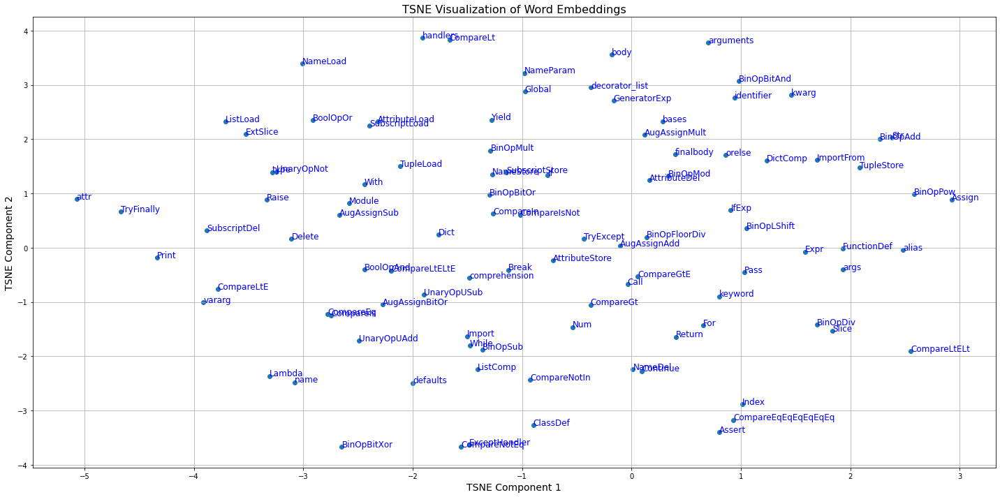

In [31]:
def search_dict_by_value(value, node_map):
    result = None
    for word, index in node_map.items():
        if value == index:
            result = word
    return result

def print_word2vec_format(outfile):
    vectors = outfile[0]
    node_map = outfile[1]
    
    with open("./py150/vectors.txt", "a") as f:
        f.write(str(len(node_map)) + " " + str(30) + "\n")  # number of tokens and length of feature embedding of each token
    index = 0
    for vector in vectors:
        word = search_dict_by_value(index, node_map)
        vector_list = list()
        for feature in vector:
            vector_list.append(str(feature))

        row = word + " " + " ".join(vector_list)

        with open("./py150/vectors.txt", "a") as f:
            f.write(row + "\n")
        index += 1

with open("./py150/vectors.pkl", "rb") as sample_file:
    samples = pickle.load(sample_file)

words = list(samples[1].keys())

print_word2vec_format(samples)  

with open("./py150/vectors.txt", "r") as f:
    vectors = {}
    for line in f.readlines()[1:]:
        word, *vector = line.split()
        vector = list(map(float, vector))
        vectors[word] = vector

Y = TSNE(n_components=2, random_state=0).fit_transform(samples[0])

plt.figure(figsize=(20, 10))  # Set the figure size to be 12x8 inches
plt.scatter(Y[:, 0], Y[:, 1])
for label, x, y in zip(words, Y[:, 0], Y[:, 1]):
    plt.annotate(label, xy=(x, y), xytext=(0, 0), textcoords="offset points", color="blue", fontsize=12)  # Increase font size to 12

plt.xlabel("TSNE Component 1", fontsize=14)  # Set x-axis label and increase font size to 14
plt.ylabel("TSNE Component 2", fontsize=14)  # Set y-axis label and increase font size to 14
plt.title("TSNE Visualization of Word Embeddings", fontsize=16)  # Set title and increase font size to 16
plt.grid(True)  # Enable grid lines
plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()


### Defining functions to compare vector embeddings of nodes:

In [33]:
def cosine_similarity(v1, v2):
    """Compute  similarity between two vectors."""
    # print(v1.shape, v2.shape)
    if(v2.shape[0]!=30):
        return 1000
    norm_v1 = np.linalg.norm(v1)
    norm_v2 = np.linalg.norm(v2)
    if norm_v1 == 0 or norm_v2 == 0:
        return 0  # Prevent division by zero
    return np.dot(v1, v2) / (norm_v1 * norm_v2)

def find_closest_vectors(target_word, word_vectors, top_n=10):
    """Find the closest vectors to the target word."""
    target_vector = word_vectors[target_word]
    closest_words = []
    for word, vector in word_vectors.items():
        if word != target_word:
            similarity = cosine_similarity(np.array(target_vector), np.array(vector))
            closest_words.append((word, similarity))
    closest_words.sort(key=lambda x: x[1], reverse=True)
    return closest_words[:top_n]

closest_words_to_for = find_closest_vectors("For", vectors)
print("Closest vectors to 'for':")
for word, similarity in closest_words_to_for:
    print(word, similarity)

print(cosine_similarity(np.array(vectors['For']), np.array(vectors['While'])))

Closest vectors to 'for':
97 1000
100 1000
Return 0.34051958079451816
Delete 0.28631435791420917
BinOpDiv 0.2608549474208338
CompareNotIn 0.2413690355326239
CompareEqEq 0.2365600828378278
comprehension 0.21701969855164663
keyword 0.21342220230905973
NameDel 0.2014731954290991
0.06109874323826108


## Method 2: Skip gram based method, using children as context for a node. <br>

In [34]:
def get_one_hot_vectors(target_word,context_words,vocab_size,word_to_index):
    trgt_word_vector = np.zeros(vocab_size)
    index_of_word_dictionary = word_to_index.get(target_word) 
    trgt_word_vector[index_of_word_dictionary] = 1
    ctxt_word_vector = np.zeros(vocab_size)
    for word in context_words:
        index_of_word_dictionary = word_to_index.get(word) 
        ctxt_word_vector[index_of_word_dictionary] = 1
    return trgt_word_vector,ctxt_word_vector

In [35]:
class SkipGram(nn.Module):
    def __init__(self, n_vocab, n_embed):
        super().__init__()
        self.embed = nn.Embedding(n_vocab, n_embed)
        self.output = nn.Linear(n_embed, n_vocab)
        self.log_softmax = nn.LogSoftmax(dim=1)
    
    def forward(self, x):
        x = self.embed(x)
        scores = self.output(x)
        log_ps = self.log_softmax(scores)
        return log_ps

In [36]:
def generate_training_data_nodes(nodes, vocab_size, word_to_index):
    training_data = []
    training_sample_words = []
    
    for i, node in enumerate(nodes):
        target_word = node['node']
        context_words = node['children']  # Extract context words from children
        
        trgt_word_vector, ctxt_word_vector = get_one_hot_vectors(target_word, context_words, vocab_size, word_to_index)
        training_data.append([trgt_word_vector, ctxt_word_vector])
        training_sample_words.append([target_word, context_words])
    
    return training_data, training_sample_words


## Skipgram training, only AST node:

In [37]:
with open("./py150/output.pkl", "rb") as sample_file:
        samples = pickle.load(sample_file)
        print(type(samples[0]), samples[0].keys())
        

<class 'dict'> dict_keys(['node', 'value', 'children', 'parent', 'children_indices'])


In [38]:
training_data, training_sample_words = generate_training_data_nodes(nodes, vocab_size, node_to_index)
print(len(training_data), len(training_sample_words))

800977 800977


In [39]:
for i in range(3):
    print('*' * 50)
    print('Target word:%s . Target vector: %s ' %(training_sample_words[i][0],training_data[i][0]))
    print('Context word:%s . Context  vector: %s ' %(training_sample_words[i][1],training_data[i][1]))

**************************************************
Target word:Module . Target vector: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] 
Context word:['Expr', 'ImportFrom', 'ImportFrom', 'ImportFrom', 'ImportFrom', 'Assign'] . Context  vector: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.] 
**************************************************
Target word:Expr . Target vector: [0. 0

In [40]:
training_data1=torch.tensor(training_data)
print(training_data1.shape)


torch.Size([800977, 2, 117])


/var/folders/2t/1b591x_d1wz5rz5gn_10qdww0000gn/T/ipykernel_21908/2003855261.py:1: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at  /Users/distiller/project/conda/conda-bld/pytorch_1639180852547/work/torch/csrc/utils/tensor_new.cpp:201.)
  training_data1=torch.tensor(training_data)


In [42]:
inputs = training_data1[:, 0, :].long()  # Extracting inputs from the first dimension
targets = training_data1[:, 1, :].long()  # Extracting targets from the second dimension
print(len(inputs))

# Create a DataLoader for mini-batch training
dataset = torch.utils.data.TensorDataset(inputs, targets)
loader = torch.utils.data.DataLoader(dataset, batch_size=256, shuffle=True)
print(inputs.shape)

800977
torch.Size([800977, 117])


In [43]:
# Define the training parameters
n_vocab = len(node_to_index)
n_embed = 30  # Assuming the embedding dimension is 30
lr = 0.01  # Learning rate
epochs = 100

# Initialize the model
model = SkipGram(vocab_size, n_embed)

# Define the loss function
criterion = nn.NLLLoss()

# Define the optimizer
optimizer = optim.SGD(model.parameters(), lr=lr)

# Initialize an empty list to store epoch losses
epoch_losses = []

# Training loop
for epoch in range(epochs):
    # Initialize epoch loss
    epoch_loss = 0
    
    # Set the model in training mode
    model.train()
    
    # Iterate over mini-batches
    for batch_inputs, batch_targets in loader:
        # Clear gradients
        optimizer.zero_grad()
        
        # Forward pass
        log_ps = model(batch_inputs)
        
        # Calculate loss
        loss = criterion(log_ps, batch_targets)
        
        # Backpropagation
        loss.backward()
        optimizer.step()
        
        # Accumulate epoch loss
        epoch_loss += loss.item()
    
    # Append the epoch loss to the list
    epoch_losses.append(epoch_loss)
    
    # Print epoch loss
    print(f'Epoch {epoch+1}/{epochs}, Loss: {epoch_loss:.4f}')

# Plotting the loss curve
plt.plot(range(1, epochs+1), epoch_losses, label='Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Loss Curve')
plt.legend()
plt.show()


Epoch 1/100, Loss: 14884.5452
Epoch 2/100, Loss: 14853.3148
Epoch 3/100, Loss: 14832.4496
Epoch 4/100, Loss: 14819.9896
Epoch 5/100, Loss: 14813.5410


KeyboardInterrupt: 

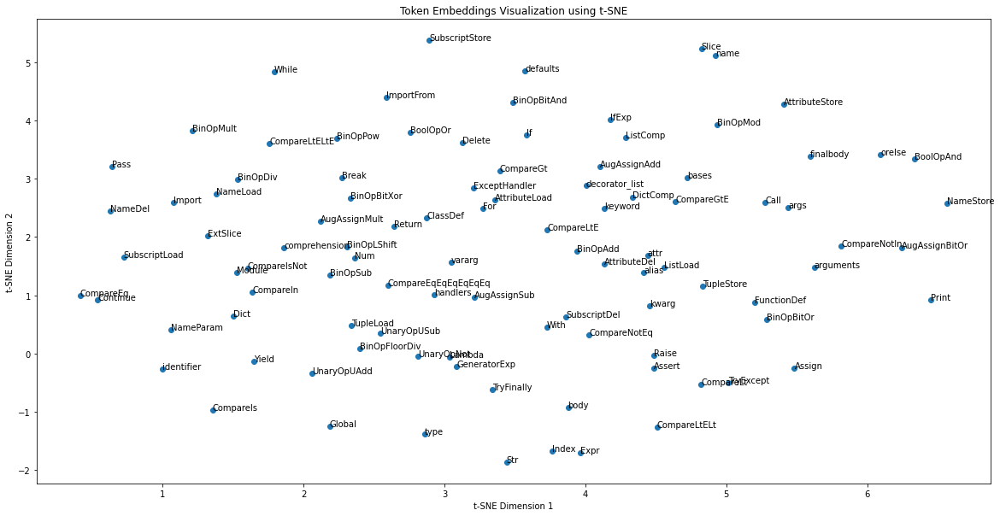

In [108]:
# Extract token embeddings
token_embeddings = model.embed.weight.data

# Apply t-SNE for dimensionality reduction to 2D
tsne = TSNE(n_components=2, random_state=42)
token_embeddings_2d = tsne.fit_transform(token_embeddings)

# Plot the tokens
plt.figure(figsize=(20, 10))
plt.scatter(token_embeddings_2d[:, 0], token_embeddings_2d[:, 1])

# Annotate tokens
# for i, txt in enumerate(nodetypes):
for i in index_to_node:
    plt.annotate(index_to_node[i], (token_embeddings_2d[i, 0], token_embeddings_2d[i, 1]))

plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.title('Token Embeddings Visualization using t-SNE')
plt.show()


We expect that these embeddings will improve with more training data- "for" will move closer to "while", etc. 

In [121]:
word_vectors= {}
for i in index_to_node:
    word_vectors[index_to_node[i]]= token_embeddings[i]
closest_words_to_for = find_closest_vectors("For",	word_vectors)
print("5 closest vectors to 'for':")
for word, similarity in closest_words_to_for:
    print(word, similarity)

5 closest vectors to 'for':
keyword 0.46595317
BinOpDiv 0.37578607
Return 0.36842197
CompareNotEq 0.35297456
CompareLtELtE 0.2764455
BinOpLShift 0.26296324
AugAssignMult 0.253114
CompareLtE 0.2514491
BinOpSub 0.24996947
CompareGt 0.2344317
BoolOpOr 0.22617969
CompareEqEqEqEqEqEq 0.22177882
bases 0.2208148
Break 0.20919302
AttributeLoad 0.2075889
Delete 0.19459724
name 0.19197103
ExceptHandler 0.19016474
UnaryOpUSub 0.17878062
Global 0.17330989
UnaryOpUAdd 0.15039438
NameParam 0.13584761
ClassDef 0.13045034
CompareNotIn 0.12911852
vararg 0.121661715
ExtSlice 0.119935386
decorator_list 0.11864327
SubscriptStore 0.11771713
comprehension 0.11619382
Expr 0.10834394


The number of features(hidden layer dimension) can be changed if we want more expresssive data.

## Method 3: Joint network:

When we discard information about the identifier name, function name etc(stored in the 'value' attribute of AST nodes), we lose information. The past methods look only at the type of AST node and does not attempt to find vector representation also at a value level. The following method also includes the value of the nodes in the AST, we jointly optimize the value based and node type based representation using en extension of the pure AST method used above. It is like simultaneous skip-gram. I use a weighted version of cross entropy loss where the value based loss is weighted less because of its large dimensionality and corresponding larger contribution to loss. <br>
Input to neural network for a node n in the AST of a python code will be a [1, n] contribution from type(Say FunctionCall)- here n~100, and a [1,n_v] contribution from the value(say function name is BubbleSort)- this is a one hot encoded version of the value where n_v is the values that occur with the highest frequency in the training dataset. It can be chosen around ~30000. These inputs combine with the weights to give [1, E] output each, where E is the size of the embedding for both the type and the value. These are concatanated and passed to the output layer, where we apply cross entropy loss/NLL for both the output context, and the output values(both defined on the basis of the children nodes), followed by back propogation to learn simultaneous optimal encodings of the node type and value. 

In [1]:
# Collect all values from nodes
all_values = [node['value'] for node in nodes]
# Count occurrences of each value
value_counts = {}
for value in all_values:
    value_counts[value] = value_counts.get(value, 0) + 1
    
# Keep only the top 30000 values that occur
top_values = sorted(value_counts.keys(), key=lambda x: value_counts[x], reverse=True)[:10000] #keeps top 10000 say
value_to_number = {value: i for i, value in enumerate(top_values)}

# Add 'unknonwn value' token for values not in the top 30000
value_to_number['unkv'] = len(top_values)

NameError: name 'nodes' is not defined

In [ ]:
def generate_training_data_joint(nodes, vocab_size, value_size, word_to_index, value_to_number):
    training_data_type = []
    training_data_value = []
    training_sample_words_type = []
    training_sample_words_value = []
    print(nodes[0])
    for i, node in enumerate(nodes):
        target_word = node['node']
        context_words = node['children']  # Extract context words from children
        target_value = node['value']
        context_values = [nodes[index]['value'] if nodes[index]['value'] in top_values else 'unkv' for index in node['children_indices']]
        print(context_values)
        # Convert target and context words to one-hot vectors
        trgt_word_vector, ctxt_word_vector = get_one_hot_vectors(target_word, context_words, vocab_size, word_to_index)
        trgt_value_vector, ctxt_value_vector = get_one_hot_vectors(target_value, context_values, value_size, value_to_number)
        # Append one-hot vectors and corresponding target values to training data
        training_data_type.append([trgt_word_vector, ctxt_word_vector])
        training_data_value.append([trgt_value_vector, ctxt_value_vector])
        training_sample_words_type.append([target_word, context_words])
        training_sample_words_value.append([target_value, context_values])
    return training_data_type, training_sample_words_type, training_data_value, training_sample_words_value

In [29]:
# Generate training data
value_size= 10000
training_data_type, training_sample_words_type, training_data_value, training_sample_words_value = generate_training_data_joint(nodes,vocab_size, value_size, node_to_index, value_to_number)
training_data_joint1 = torch.tensor(training_data_type)
training_data_joint2 = torch.tensor(training_data_value)
print(training_data_joint1.shape, training_data_joint2.shape)

{'node': 'Module', 'value': None, 'children': ['Expr', 'ImportFrom', 'ImportFrom', 'ImportFrom', 'ImportFrom', 'Assign'], 'parent': None, 'children_indices': [1, 3, 5, 7, 9, 11]}


: 

: 

kernel crashing repeatedly

Potential architecture in pytorch

In [ ]:
class JointEmbeddingModel(nn.Module):
    def __init__(self, num_ast_nodes, num_vocab_words, embedding_dim, hidden_dim):
        super(JointEmbeddingModel, self).__init__()
        self.ast_embedding = nn.Embedding(num_ast_nodes, embedding_dim)
        self.word_embedding = nn.Embedding(num_vocab_words, embedding_dim)
        self.fc_ast = nn.Linear(2 * embedding_dim, num_ast_nodes)
        self.fc_word = nn.Linear(2 * embedding_dim, num_vocab_words)
        self.log_softmax = nn.LogSoftmax(dim=1)

    def forward(self, ast_node_type, vocab_word):
        ast_embedded = self.ast_embedding(ast_node_type)
        word_embedded = self.word_embedding(vocab_word)
        combined = torch.cat((ast_embedded, word_embedded), dim=1)
        out_ast = self.log_softmax((self.fc_ast(combined)))
        out_word = self.log_softmax((self.fc_word(combined)))
        return out_ast, out_word

# hyperparameters
num_ast_nodes = 100
num_vocab_words = 30000
embedding_dim = 300
hidden_dim = 600
lambda_val = 0.1  # Hyperparameter for balancing the loss

model = JointEmbeddingModel(num_ast_nodes, num_vocab_words, embedding_dim, hidden_dim)
criterion = nn.NLLLoss()# Use NLL loss with softmax, CE with sigmoid 


# use NLL loss

# Forward pass
# output_ast, output_word = model(ast_node_type, vocab_word)

# # Calculate loss
# loss_ast = criterion(output_ast, target_ast)
# loss_word = criterion(output_word, target_word)
# total_loss = loss_ast + lambda_val * loss_word

Training

In [ ]:
optimizer = optim.Adam(model.parameters(), lr=0.001)  
num_epochs = 10 

for epoch in range(num_epochs):
    model.train()  
    total_loss = 0.0  
    
    for batch_idx, (ast_node_type, vocab_word, target_ast, target_word) in enumerate(train_loader):
        # Forward pass
        output_ast, output_word = model(ast_node_type, vocab_word)
        
        # Calculate loss
        loss_ast = criterion(output_ast, target_ast)
        loss_word = criterion(output_word, target_word)
        total_loss += (loss_ast + lambda_val * loss_word).item()  
        
        # Backpropagation
        optimizer.zero_grad() 
        (loss_ast + lambda_val * loss_word).backward()  
        optimizer.step() 
    
    print(f"Epoch [{epoch+1}/{num_epochs}], Avg. Loss: {total_loss / len(train_loader):.4f}")


Due to time and Computing constraints, I was unable to train such a large network. The above embeddings can be used for useful downstream tasks like program classification, code completion, semantic code search etc, which need labeled data. <br>
In the above experiments, I have attempted to combine concepts from programming languages and deep learning to develop embeddings for source code.<br>
However over the last few years, these methods have become less useful due to the large scale success of transformer models.<br>
Transformer models trained on large context lengths can automatically infer the structure of code, and learn useful internal vector representations. Given the computational budget and training data, perhaps the best approach to this problem would be to train an encoder-decoder transformer (like BERT), and use the encoder to generate embeddings.<br>
Fine tuning open source models on a target task could also yield good results!